In [1]:
# standard ds imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# for statistical analysis
import scipy.stats as stats

# for visualization
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

# for wrangling
import wrangle
import explore

# for scaling
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, QuantileTransformer

# for feature selection verification and evaluation 
from sklearn.metrics import r2_score, mean_squared_error, explained_variance_score
from sklearn.feature_selection import SelectKBest, RFE, f_regression, SequentialFeatureSelector
from sklearn.linear_model import LinearRegression, LassoLars, TweedieRegressor
from sklearn.preprocessing import PolynomialFeatures

In [2]:
zil = wrangle.acquire_zillow()

In [3]:
zil = wrangle.prepare_zillow(zil)

/Users/morgancross/codeup-data-science/projects/regression_project_zillow/wrangle.py:59: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df.poolcnt = np.where(df.pool.isnull(), 0, 1)
/Users/morgancross/codeup-data-science/projects/regression_project_zillow/wrangle.py:66: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['location'] = df.city.map({6037: 'Los Angeles', 6059: 'Orange', 6111:'Ventura'})


In [4]:
zil.head()

,baths,beds,area,lot_size,value,year_built,zipcode,lat,long,garage,...,location,los_angeles,orange,ventura,decade,yard_size,living_space,half_bath,census_tract,census_block
2,2.0,3.0,1243.0,8432.0,564778.0,1962.0,97078.0,33886168.0,-117823170.0,2.0,...,Orange,0,1,0,1960,7189.0,767.0,0,60590218,22012
3,3.0,4.0,2376.0,13038.0,145143.0,1970.0,96330.0,34245180.0,-118240722.0,1.0,...,Los Angeles,1,0,0,1960,10662.0,1728.0,0,60373001,100601
7,3.0,4.0,2540.0,10384.0,430108.0,1999.0,96374.0,34434971.0,-118464390.0,1.0,...,Los Angeles,1,0,0,1990,7844.0,1892.0,0,60379200,341014
19,3.0,2.0,3230.0,18200.0,954106.0,1967.0,97005.0,33760091.0,-117789669.0,3.0,...,Orange,0,1,0,1960,14970.0,2846.0,0,60590756,63007995
20,3.0,4.0,2447.0,7911.0,1083000.0,1967.0,96122.0,33770258.0,-118363785.0,1.0,...,Los Angeles,1,0,0,1960,5464.0,1799.0,0,60376704,31017005


In [5]:
zil.isnull().sum()

baths           0
beds            0
area            0
lot_size        0
value           0
year_built      0
zipcode         0
lat             0
long            0
garage          0
pool            0
location        0
los_angeles     0
orange          0
ventura         0
decade          0
yard_size       0
living_space    0
half_bath       0
census_tract    0
census_block    0
dtype: int64

In [6]:
zil.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9048 entries, 2 to 52427
Data columns (total 21 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   baths         9048 non-null   float64
 1   beds          9048 non-null   float64
 2   area          9048 non-null   float64
 3   lot_size      9048 non-null   float64
 4   value         9048 non-null   float64
 5   year_built    9048 non-null   float64
 6   zipcode       9048 non-null   float64
 7   lat           9048 non-null   float64
 8   long          9048 non-null   float64
 9   garage        9048 non-null   float64
 10  pool          9048 non-null   float64
 11  location      9048 non-null   object 
 12  los_angeles   9048 non-null   int64  
 13  orange        9048 non-null   int64  
 14  ventura       9048 non-null   int64  
 15  decade        9048 non-null   int64  
 16  yard_size     9048 non-null   float64
 17  living_space  9048 non-null   float64
 18  half_bath     9048 non-null

In [8]:
zil.zipcode.idxmax()

3145

In [9]:
zil = zil.drop(index=3145)

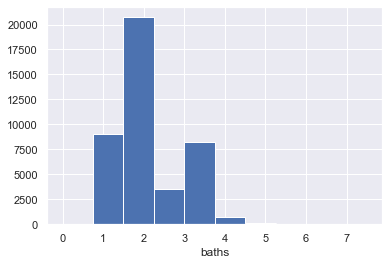

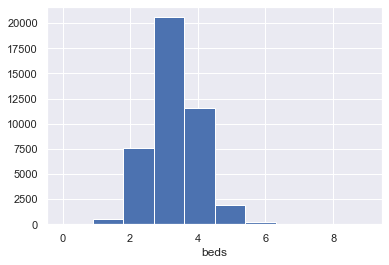

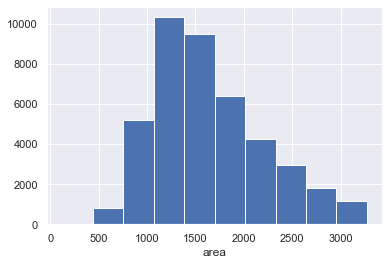

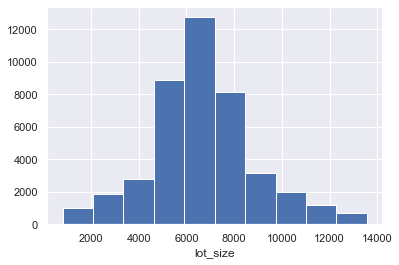

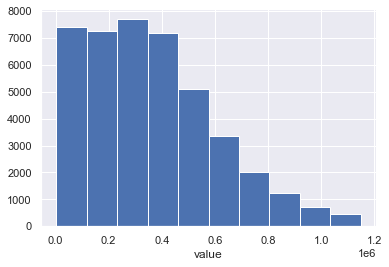

...

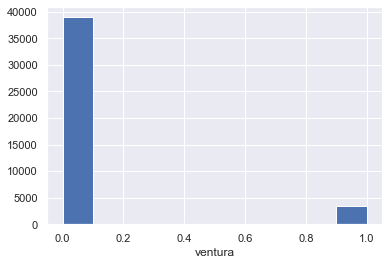

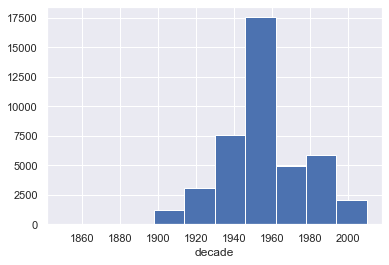

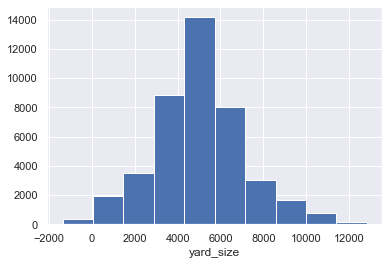

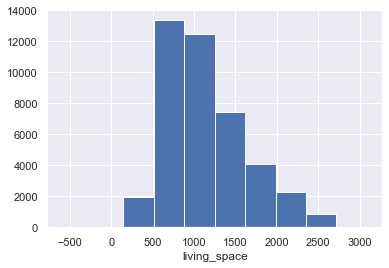

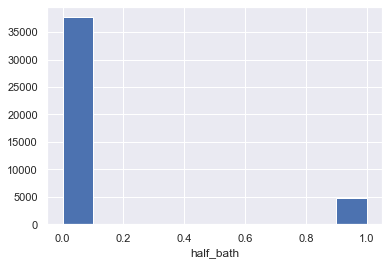

In [5]:
for col in zil.columns.tolist():
    plt.hist(zil[col])
    plt.xlabel(col)
    plt.show()

In [6]:
zil.describe().T

,count,mean,std,min,25%,50%,75%,max
baths,42414.0,2.055253e+00,7.265907e-01,0.0,2.0,2.0,2.50,7.5
beds,42414.0,3.175932e+00,8.423346e-01,0.0,3.0,3.0,4.00,9.0
area,42414.0,1.640807e+03,5.706424e+02,128.0,1218.0,1534.0,1984.00,3269.0
lot_size,42414.0,6.642722e+03,2.197314e+03,800.0,5366.0,6499.0,7700.00,13569.0
value,42414.0,3.637910e+05,2.395629e+05,3254.0,170000.0,329297.0,506397.50,1149000.0
year_built,42414.0,1.961000e+03,2.185798e+01,1878.0,1950.0,1958.0,1975.00,2016.0
zipcode,42414.0,9.656489e+04,4.194820e+02,95982.0,96206.0,96415.0,96996.00,97330.0
los_angeles,42414.0,6.472627e-01,4.778275e-01,0.0,0.0,1.0,1.00,1.0
orange,42414.0,2.712784e-01,4.446246e-01,0.0,0.0,0.0,1.00,1.0
ventura,42414.0,8.145895e-02,2.735419e-01,0.0,0.0,0.0,0.00,1.0


In [7]:
zil.isnull().sum()

baths           0
beds            0
area            0
lot_size        0
value           0
year_built      0
zipcode         0
location        0
los_angeles     0
orange          0
ventura         0
decade          0
yard_size       0
living_space    0
half_bath       0
census_tract    0
census_block    0
dtype: int64

In [10]:
train, val, test = wrangle.split_data(zil)

In [11]:
train.head()

,baths,beds,area,lot_size,value,year_built,zipcode,lat,long,garage,...,location,los_angeles,orange,ventura,decade,yard_size,living_space,half_bath,census_tract,census_block
51225,1.0,3.0,1067.0,5407.0,65598.0,1949.0,96496.0,34039406.0,-118135828.0,1.0,...,Los Angeles,1,0,0,1940,4340.0,631.0,0,60374827,2201
3669,3.0,5.0,2603.0,12342.0,135604.0,1966.0,96370.0,34293665.0,-118500322.0,1.0,...,Los Angeles,1,0,0,1960,9739.0,1823.0,0,60371066,452006996
40091,3.0,5.0,2340.0,7243.0,704000.0,1969.0,96352.0,34371515.0,-118541420.0,1.0,...,Los Angeles,1,0,0,1960,4903.0,1560.0,0,60379203,134
25937,2.0,4.0,1782.0,6613.0,333484.0,1981.0,96401.0,34428839.0,-118405853.0,1.0,...,Los Angeles,1,0,0,1980,4831.0,1174.0,0,60379108,72008
52229,5.0,5.0,3757.0,5317.0,1495000.0,2001.0,96337.0,34141391.0,-118627662.0,1.0,...,Los Angeles,1,0,0,2000,1560.0,2897.0,0,60378001,11002004


In [12]:
cols_to_scale = ['beds', 'baths', 'area', 'lot_size', 'year_built', 'zipcode', 'yard_size', 'living_space', 'half_bath', 'census_tract', 'garage', 'pool', 'census_block', 'lat', 'long']

In [13]:
train_scaled, val_scaled, test_scaled = wrangle.scale_data(train, val, test, cols_to_scale)

In [14]:
train_scaled.head()

,baths,beds,area,lot_size,value,year_built,zipcode,lat,long,garage,...,location,los_angeles,orange,ventura,decade,yard_size,living_space,half_bath,census_tract,census_block
51225,0.166667,0.375,0.133283,0.212501,65598.0,0.492063,0.001692,0.487981,0.679078,0.2,...,Los Angeles,1,0,0,1940,0.259470,0.072332,0.0,0.005163,3.780049e-06
3669,0.500000,0.625,0.521750,0.497493,135604.0,0.626984,0.001278,0.679726,0.476064,0.2,...,Los Angeles,1,0,0,1960,0.472726,0.400165,0.0,0.000074,7.766403e-01
40091,0.500000,0.625,0.455235,0.287951,704000.0,0.650794,0.001218,0.738436,0.453173,0.2,...,Los Angeles,1,0,0,1960,0.281708,0.327833,0.0,0.011084,2.285212e-07
25937,0.333333,0.500,0.314112,0.262061,333484.0,0.746032,0.001380,0.781666,0.528681,0.2,...,Los Angeles,1,0,0,1980,0.278864,0.221672,0.0,0.010956,1.237227e-04
52229,0.833333,0.625,0.813606,0.208802,1495000.0,0.904762,0.001169,0.564892,0.405138,0.2,...,Los Angeles,1,0,0,2000,0.149662,0.695545,0.0,0.009458,1.890369e-02


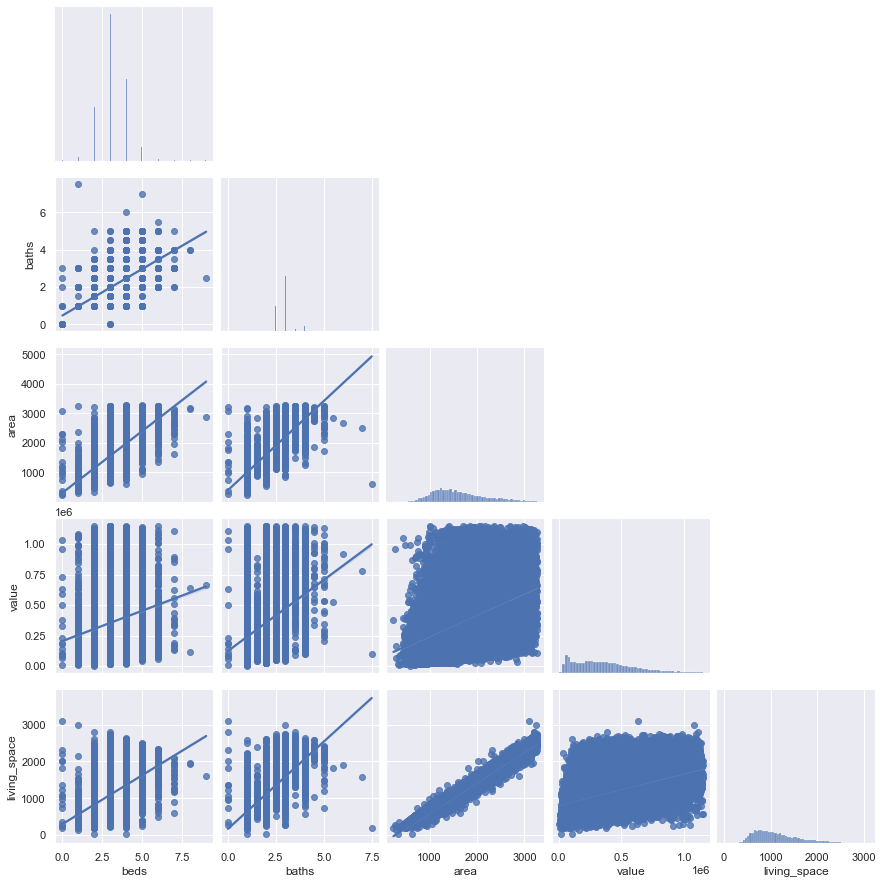

In [15]:
sns.pairplot(data=train[['beds','baths', 'area', 'value', 'living_space']], corner=True, kind='reg')

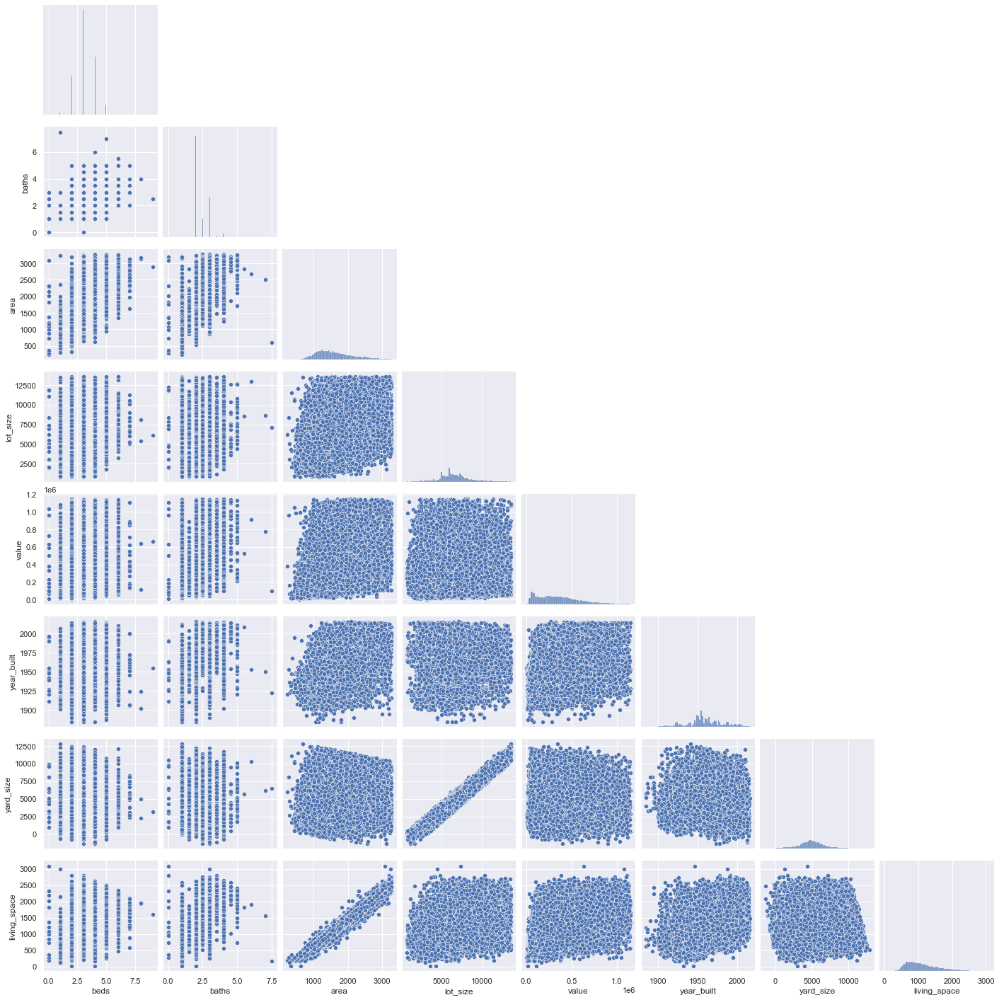

In [16]:
sns.pairplot(data=train[['beds','baths', 'area', 'lot_size', 'value', 'year_built', 'yard_size', 'living_space']], corner=True)

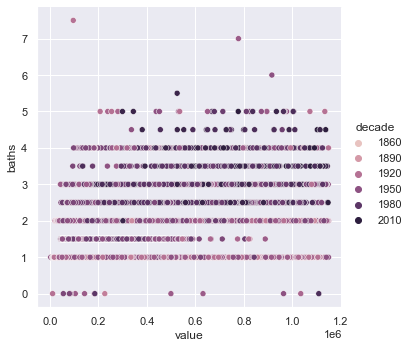

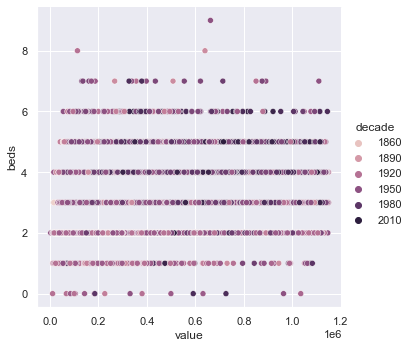

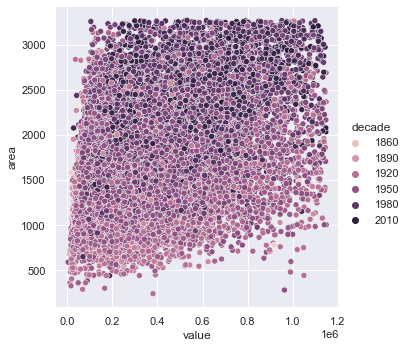

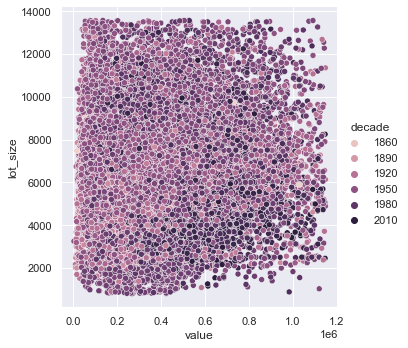

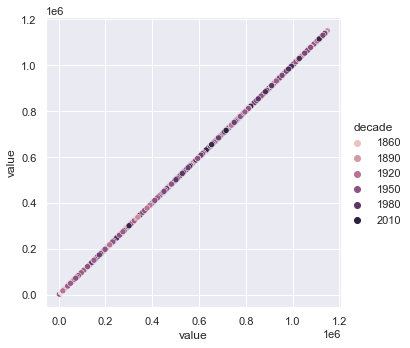

...

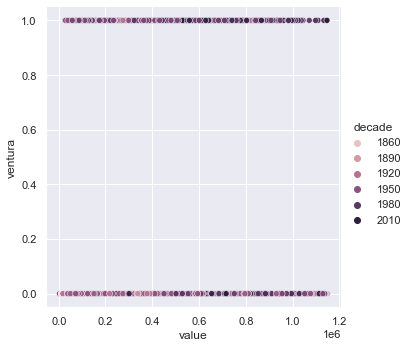

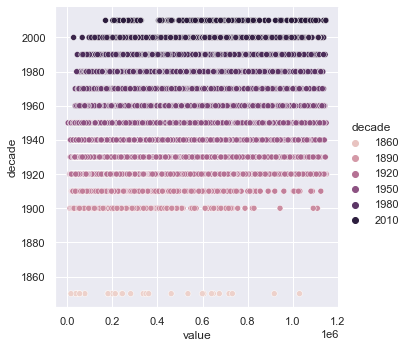

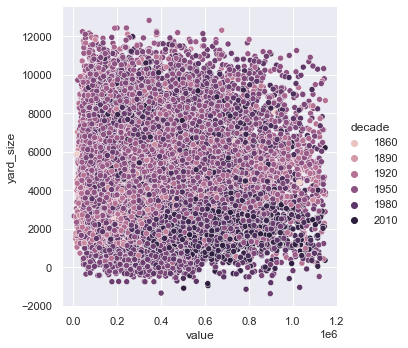

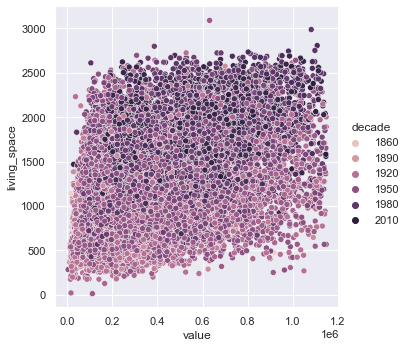

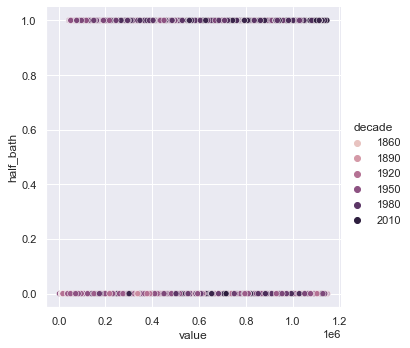

In [17]:
for col in train.columns.tolist():
    sns.relplot(data=train, x='value', y=col, hue='decade')
    plt.ylabel(col)
    plt.show()

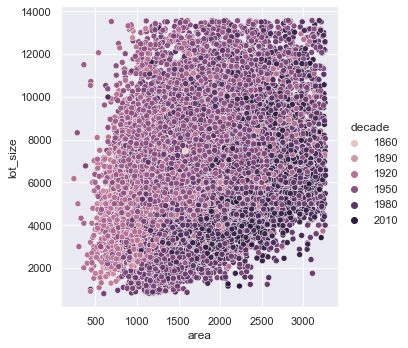

In [18]:
sns.relplot(data=train, x='area', y='lot_size', hue='decade')

In [19]:
# lots are getting smaller while houses are getting bigger over time

In [20]:
train['brackets'] = pd.cut(train.value, 10, labels=[1,2,3,4,5,6,7,8,9,10])

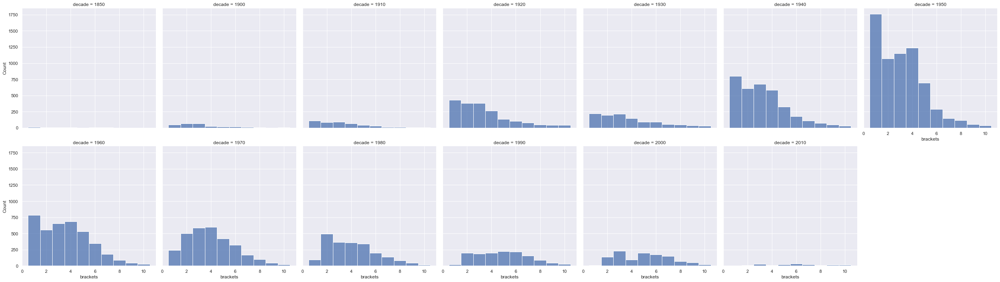

In [21]:
sns.displot(data=train, x='brackets', col='decade', col_wrap=7)

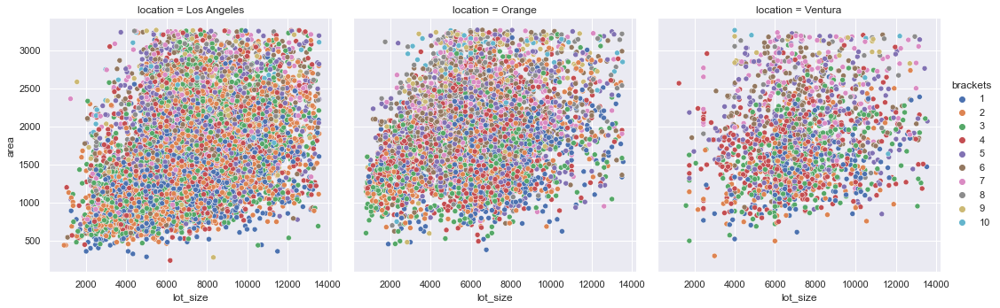

In [22]:
sns.relplot(data=train, x='lot_size', y='area', col='location', hue='brackets')

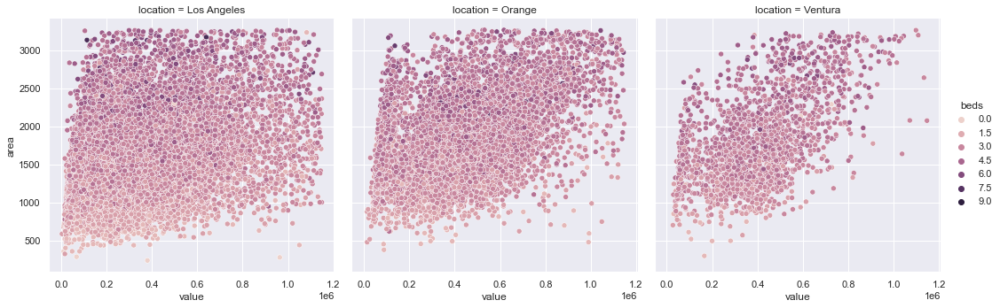

In [23]:
sns.relplot(data=train, x='value', y='area', col='location', hue='beds')

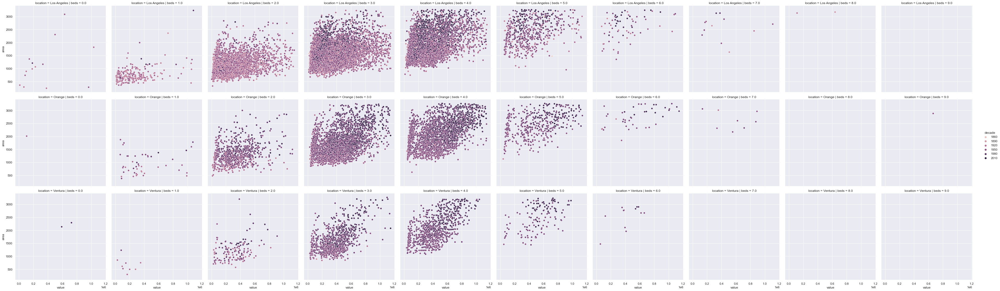

In [24]:
sns.relplot(data=train, x='value', y='area', row='location', hue='decade', col='beds')

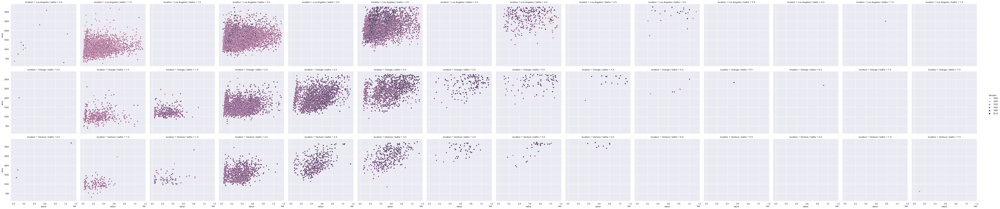

In [25]:
sns.relplot(data=train, x='value', y='area', row='location', hue='decade', col='baths')

In [27]:
train.beds.median(), train.baths.median()

(3.0, 2.0)

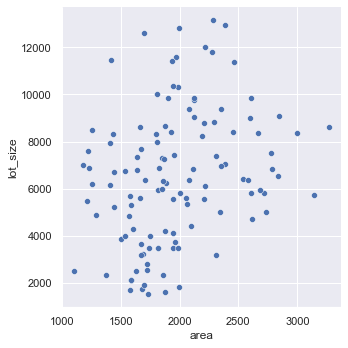

In [28]:
sns.relplot(data=train[(train.beds == 2)&(train.baths == 3)], x='area', y='lot_size')

In [29]:
# train['yard_size'] = train.lot_size - train.area

<AxesSubplot:xlabel='yard_size', ylabel='Count'>

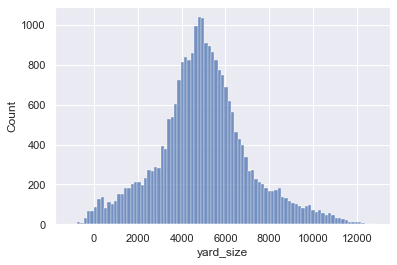

In [30]:
sns.histplot(data=train, x=train.yard_size)

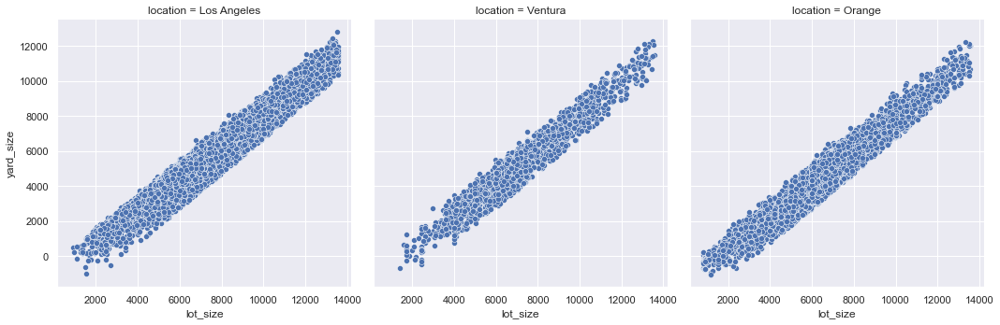

In [31]:
sns.relplot(data=train, x='lot_size', y='yard_size', col='location')

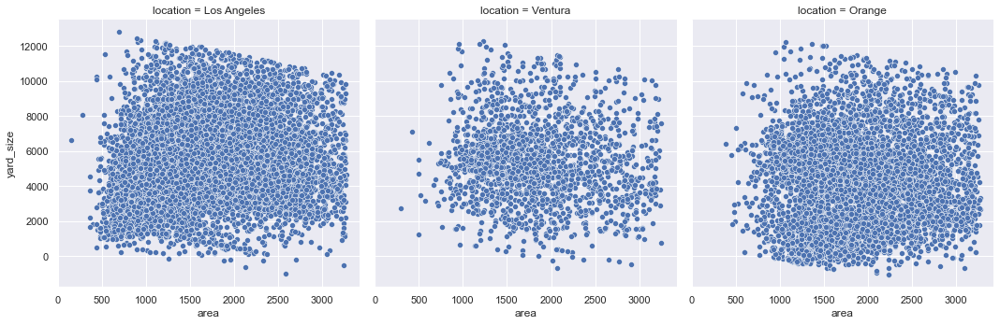

In [32]:
sns.relplot(data=train, x='area', y='yard_size', col='location')

In [33]:
# house size does not change as plot size increases.

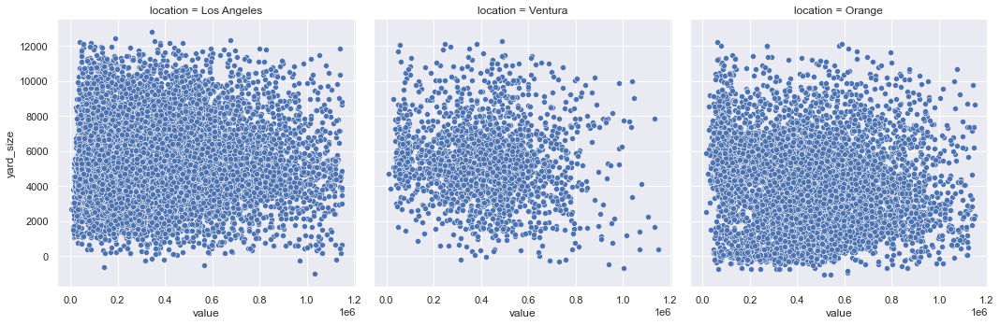

In [34]:
sns.relplot(data=train, x='value', y='yard_size', col='location')

<AxesSubplot:xlabel='brackets', ylabel='area'>

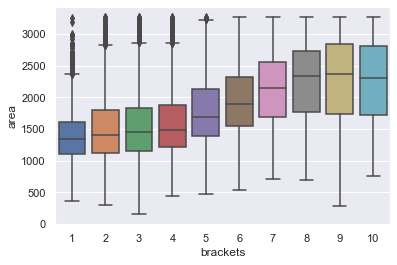

In [35]:
sns.boxplot(data=train, x='brackets', y='area')

In [36]:
# house value goes up as area increases

<AxesSubplot:xlabel='brackets', ylabel='year_built'>

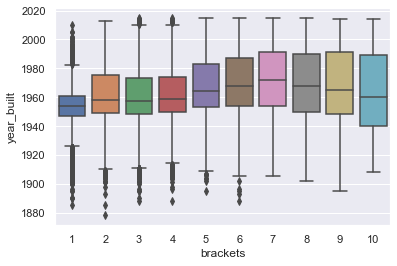

In [37]:
sns.boxplot(data=train, x='brackets', y='year_built')

In [38]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25451 entries, 18507 to 48352
Data columns (total 15 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   baths         25451 non-null  float64 
 1   beds          25451 non-null  float64 
 2   area          25451 non-null  float64 
 3   lot_size      25451 non-null  float64 
 4   value         25451 non-null  float64 
 5   year_built    25451 non-null  float64 
 6   location      25451 non-null  object  
 7   los_angeles   25451 non-null  int64   
 8   orange        25451 non-null  int64   
 9   ventura       25451 non-null  int64   
 10  decade        25451 non-null  int64   
 11  yard_size     25451 non-null  float64 
 12  living_space  25451 non-null  float64 
 13  half_bath     25451 non-null  int64   
 14  brackets      25451 non-null  category
dtypes: category(1), float64(8), int64(5), object(1)
memory usage: 3.9+ MB


In [39]:
train.brackets = train.brackets.astype(int)

<AxesSubplot:xlabel='brackets', ylabel='area'>

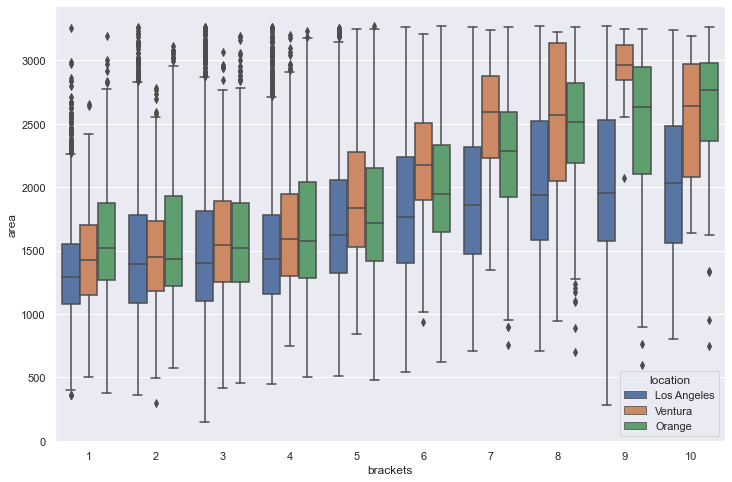

In [40]:
plt.figure(figsize=(12,8))
sns.boxplot(data=train, x='brackets', y='area', hue='location')

In [41]:
# Orange is the most expensive, overall. large boujee homes are in ventura

In [42]:
# train['living_space'] = train.area - train.beds*132 - train.baths*40

<AxesSubplot:xlabel='value', ylabel='living_space'>

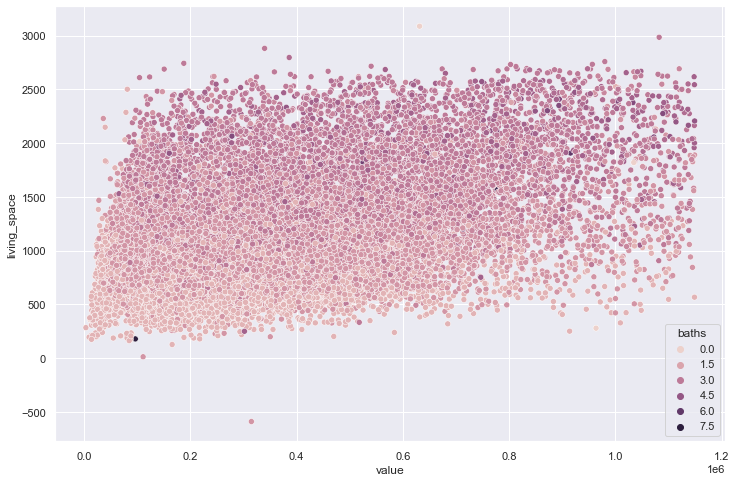

In [43]:
plt.figure(figsize=(12,8))
sns.scatterplot(data=train, y='living_space', x='value', hue='baths')

In [44]:
# more beds and baths still have the largest living space

<Figure size 864x576 with 0 Axes>

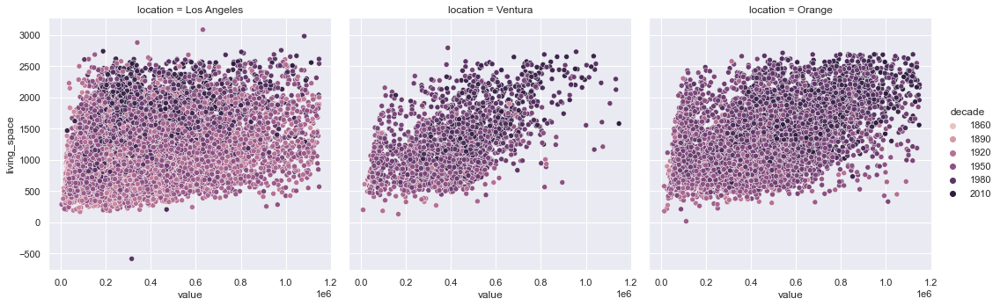

In [45]:
plt.figure(figsize=(12,8))
sns.relplot(data=train, y='living_space', x='value', hue='decade', col='location')

In [46]:
# newer homes have more living space

In [47]:
train.columns

Index(['baths', 'beds', 'area', 'lot_size', 'value', 'year_built', 'location',
       'los_angeles', 'orange', 'ventura', 'decade', 'yard_size',
       'living_space', 'half_bath', 'brackets'],
      dtype='object')

In [48]:
temp = train.lot_size/train.baths

<Figure size 864x576 with 0 Axes>

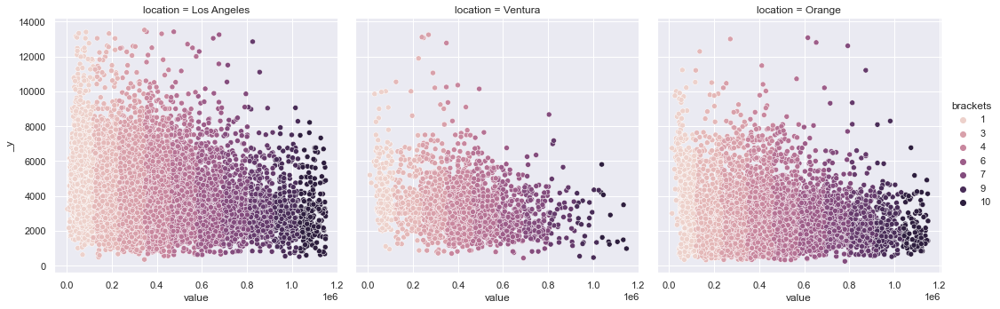

In [49]:
plt.figure(figsize=(12,8))
sns.relplot(data=train, x='value', y=temp, col='location', hue='brackets')

In [50]:
# there is a slight negative correlation with lot_size/baths and value. implying...the less value a house has, the more space per bathroom
# this could simply be due to more high value homes have more bathrooms, thus cutting the lotsize into smaller pieces.?

(0.0, 20.0)

<Figure size 864x576 with 0 Axes>

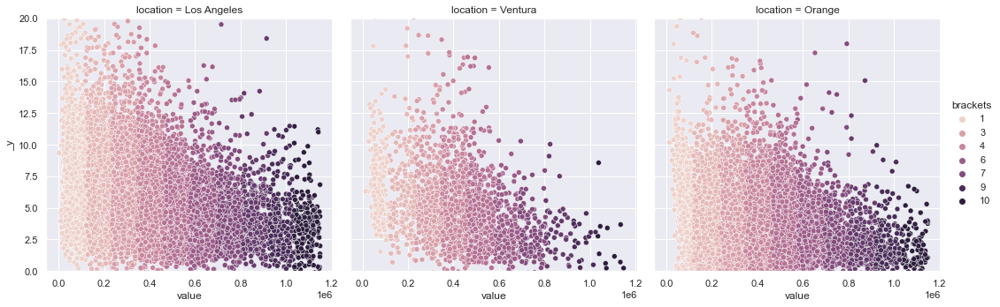

In [51]:
temp = train.yard_size/train.living_space
plt.figure(figsize=(12,8))
sns.relplot(data=train, x='value', y=temp, col='location', hue='brackets')
plt.ylim(0,20)

In [52]:
# the more expensive a home, the less yard/living space. implying houses are getting bigger or yards are getting smaller

In [26]:
train.columns.tolist()

['baths',
 'beds',
 'area',
 'lot_size',
 'value',
 'year_built',
 'zipcode',
 'location',
 'los_angeles',
 'orange',
 'ventura',
 'decade',
 'yard_size',
 'living_space',
 'half_bath',
 'brackets']

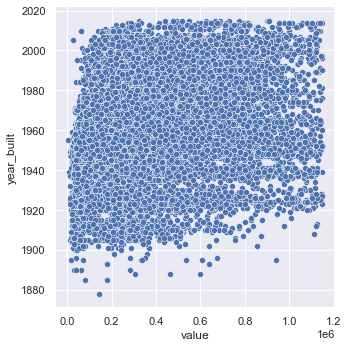

In [54]:
sns.relplot(data=train, x='value', y='year_built')

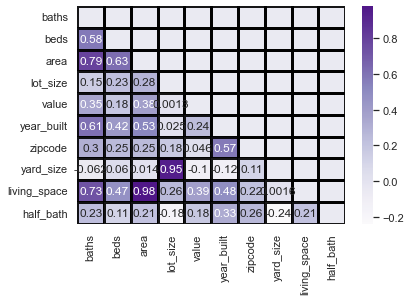

In [27]:
zil_corr = train.drop(columns=['decade', 'location', 'los_angeles', 'orange', 'ventura']).corr(method='spearman')
kwargs = {'alpha':.9,
          'linewidth':3, 
          'linestyle':'-',
          'linecolor':'black'}

sns.heatmap(zil_corr, cmap='Purples', annot=True, mask=np.triu(zil_corr), **kwargs)
plt.show()

In [28]:
# area and baths have a strong corrlation 

# yard was built from lot
# living space was built from area
# brackets was built from value

# Create MVP

#### Ho1. Homes with above median baths and below median beds have a higher value than the opposite
- Ha1: Homes with above median baths and below median beds have a lower or equal value than the opposite
    - T-test -> two sample, one tail
    - Not normally distributed by heavy in samples -> central limit theorem
    - Need to test for equal variances

In [57]:
α = 0.05
baths_above = train[(train.baths > train.baths.median())&(train.beds < train.beds.median())].value
baths_below = train[(train.baths < train.baths.median())&(train.beds > train.beds.median())].value

In [58]:
s, p = stats.levene(baths_above, baths_below)
p < α

True

In [59]:
t, p = stats.ttest_ind(baths_above, baths_below, equal_var=False)
t,p

(8.519417332878355, 2.8957345956194974e-16)

In [60]:
if p/2 < α and t > 0:
    print('Reject Ho1')
else:
    print('Fail to reject Ho1')

Reject Ho1


#### A to H1:
- Reject Ho1. Findings suggest there is a higher value in more bathrooms than more bedrooms
----

#### Ho2. Homes with above median area have greater value than homes with below medain area
- Ha2: Homes with above median area have less than or equal value to homes with below median area
    - T-test -> two-sample, one tail
    - Not normally distributed but heavy in samples -> central limit theorem
    - Need to test for equal variances

In [61]:
α = 0.05
area_above = train[train.area > train.area.median()].value
area_below = train[train.area <= train.area.median()].value

In [62]:
s, p = stats.levene(area_above, area_below)
p < α

True

In [63]:
t, p = stats.ttest_ind(area_above, area_below, equal_var=False)

In [64]:
if p/2 < α and t > 0:
    print('Reject Ho2')
else:
    print('Fail to reject Ho2')

Reject Ho2


#### A to H2:
- Reject Ho2. Findings suggest there is a higher value in above median area than below or equal to median area
----

#### Ha3: There is an association between beds and baths
 - Ho3: There is no association between beds and baths

In [65]:
α = 0.05
observed = pd.crosstab(train.beds, train.baths)
chi2,pval,degf,expected = stats.chi2_contingency(observed)
pval < α

True

In [66]:
observed

baths,0.0,1.0,1.5,2.0,2.5,3.0,3.5,4.0,4.5,5.0,5.5,6.0,7.0,7.5
beds,,,,,,,,,,,,,,
0.0,9,1,0,1,1,0,0,0,0,0,0,0,0,0
1.0,0,274,0,23,0,4,0,0,0,0,0,0,0,1
2.0,0,2865,105,1335,109,119,7,0,0,1,0,0,0,0
3.0,2,2106,294,7336,1069,1460,52,57,4,1,0,0,0,0
4.0,0,110,58,3127,864,2471,109,187,13,12,0,1,0,0
5.0,0,14,0,188,96,635,41,127,10,8,1,0,1,0
6.0,0,0,0,22,5,57,3,27,1,2,1,0,0,0
7.0,0,0,0,2,0,9,1,8,0,1,0,0,0,0
8.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


#### A to H3:
- Reject Ho3. Findings suggest there is an association between beds and baths
---

#### Ha4: The mean value of homes with half baths is higher than the mean value of homes with only full baths
 - Ho4: The mean value of homes with half baths is lower or equal to the mean value of homes with only full baths
    - T-test -> 2 sample, 1 tail

In [67]:
halfs = train[train.baths%1 != 0].value
fulls = train[train.baths%1 == 0].value

In [68]:
α = 0.05
s, p = stats.levene(halfs, fulls)
p < α

False

In [69]:
t, p = stats.ttest_ind(halfs, fulls, equal_var=True)
t, p

(26.551499862840796, 3.021602627476837e-153)

In [70]:
if p/2 < α and t > 0:
    print('Reject Ho4')
else:
    print('Fail to reject Ho4')

Reject Ho4


#### A to H4:
 - Reject Ho4. Findings suggest there is more value in homes with half baths than those without.

In [21]:
train.head()

,baths,beds,area,lot_size,value,year_built,location,los_angeles,orange,ventura,decade,yard_size,living_space,half_bath,half_bath_labels
18507,2.0,2.0,1822.0,7129.0,84335.0,1936.0,Los Angeles,1,0,0,1930,5307.0,1478.0,0,NaN
27044,2.0,4.0,1352.0,7498.0,98346.0,1955.0,Los Angeles,1,0,0,1950,6146.0,744.0,0,NaN
22063,2.5,3.0,2167.0,5982.0,473303.0,1997.0,Ventura,0,0,1,1990,3815.0,1671.0,1,NaN
17029,2.0,3.0,2108.0,7500.0,126696.0,1933.0,Los Angeles,1,0,0,1930,5392.0,1632.0,0,NaN
21296,2.0,4.0,1698.0,8176.0,296484.0,1973.0,Orange,0,1,0,1970,6478.0,1090.0,0,NaN


In [22]:
train['half_bath_labels'] = train.half_bath.map({0: 'Full Bath Home',
                                            1: 'Half Bath Home'})

In [23]:
train.half_bath_labels.value_counts()

Full Bath Home    22605
Half Bath Home     2846
Name: half_bath_labels, dtype: int64

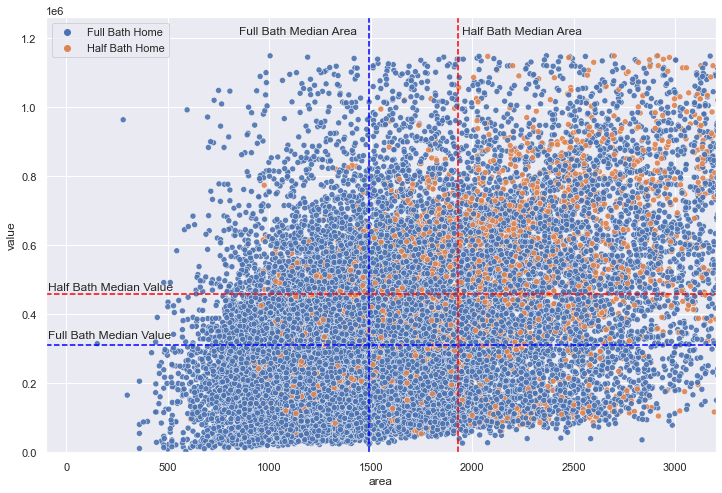

In [25]:
plt.figure(figsize=(12,8))
sns.scatterplot(data=train, y='value', x='area', hue='half_bath_labels', alpha=.9)

median_value_halfs = train[train.half_bath_labels=='Half Bath Home'].value.median()
plt.axhline(median_value_halfs, color='red', linestyle='--')
median_value_fullss = train[train.half_bath_labels=='Full Bath Home'].value.median()
plt.axhline(median_value_fullss, color='blue', linestyle='--')


median_space_halfs = train[train.half_bath_labels=='Half Bath Home'].area.median()
plt.axvline(median_space_halfs, color='red', linestyle='--')
median_space_fulls = train[train.half_bath_labels=='Full Bath Home'].area.median()
plt.axvline(median_space_fulls, color='blue', linestyle='--')

plt.annotate('Half Bath Median Value', xy=(0,0), xytext=(-90,470000))
plt.annotate('Full Bath Median Value', xy=(0,0), xytext=(-90,330000))

plt.annotate('Half Bath Median Area', xy=(0,0), xytext=(1950,1210000))
plt.annotate('Full Bath Median Area', xy=(0,0), xytext=(850,1210000))
plt.ylim(0,1260000)
plt.xlim(-100,3200)

plt.legend()

plt.show()

In [26]:
train_scaled.head()

,baths,beds,area,lot_size,value,year_built,location,los_angeles,orange,ventura,decade,yard_size,living_space,half_bath
18507,0.266667,0.222222,0.535772,0.495770,84335.0,0.423358,Los Angeles,1,0,0,1930,0.459331,0.562177,0.0
27044,0.266667,0.444444,0.384986,0.524675,98346.0,0.562044,Los Angeles,1,0,0,1950,0.519669,0.362449,0.0
22063,0.333333,0.333333,0.646455,0.405922,473303.0,0.868613,Ventura,0,0,1,1990,0.352032,0.614694,1.0
17029,0.266667,0.333333,0.627526,0.524832,126696.0,0.401460,Los Angeles,1,0,0,1930,0.465444,0.604082,0.0
21296,0.266667,0.444444,0.495990,0.577785,296484.0,0.693431,Orange,0,1,0,1970,0.543545,0.456599,0.0


In [27]:
train.head()

,baths,beds,area,lot_size,value,year_built,location,los_angeles,orange,ventura,decade,yard_size,living_space,half_bath,half_bath_labels
18507,2.0,2.0,1822.0,7129.0,84335.0,1936.0,Los Angeles,1,0,0,1930,5307.0,1478.0,0,Full Bath Home
27044,2.0,4.0,1352.0,7498.0,98346.0,1955.0,Los Angeles,1,0,0,1950,6146.0,744.0,0,Full Bath Home
22063,2.5,3.0,2167.0,5982.0,473303.0,1997.0,Ventura,0,0,1,1990,3815.0,1671.0,1,Half Bath Home
17029,2.0,3.0,2108.0,7500.0,126696.0,1933.0,Los Angeles,1,0,0,1930,5392.0,1632.0,0,Full Bath Home
21296,2.0,4.0,1698.0,8176.0,296484.0,1973.0,Orange,0,1,0,1970,6478.0,1090.0,0,Full Bath Home


### Time to do some modeling

In [28]:
X_train1, y_train = train_scaled[['baths', 'beds', 'area', 'living_space', 'half_bath']], train.value
X_val1, y_val = val_scaled[['baths', 'beds', 'area', 'living_space', 'half_bath']], val.value
X_test1, y_test = test_scaled[['baths', 'beds', 'area', 'living_space', 'half_bath']], test.value

In [29]:
y_train.mean()

362784.11751994025

In [30]:
y_train = pd.DataFrame(y_train)
y_val = pd.DataFrame(y_val)
y_test = pd.DataFrame(y_test)

In [33]:
pred_mean = y_train.value.mean()
y_train['pred_mean'] = pred_mean
y_val['pred_mean'] = pred_mean

pred_median = y_train.value.median()
y_train['pred_median'] = pred_median
y_val['pred_median'] = pred_median

rmse_train = mean_squared_error(y_train.value, y_train.pred_mean, squared=False)
rmse_val = mean_squared_error(y_val.value, y_val.pred_mean, squared=False)

print("RMSE using Mean\nTrain/In-Sample: ", round(rmse_train, 2), 
      "\nValidate/Out-of-Sample: ", round(rmse_val, 2))
print()

rmse_train = mean_squared_error(y_train.value, y_train.pred_median, squared=False)
rmse_val = mean_squared_error(y_val.value, y_val.pred_median, squared=False)

print("RMSE using Median\nTrain/In-Sample: ", round(rmse_train, 2), 
      "\nValidate/Out-of-Sample: ", round(rmse_val, 2))

RMSE using Mean
Train/In-Sample:  239086.76 
Validate/Out-of-Sample:  238064.19

RMSE using Median
Train/In-Sample:  241536.34 
Validate/Out-of-Sample:  240838.37


In [34]:
# Baseline mean is better

In [35]:
metrics = pd.DataFrame(data=[{
    'model': 'baseline_mean',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_mean)}])
metrics

,model,rmse_val,r2_val
0,baseline_mean,240838.367605,0.0


In [36]:
# OLS Model
lm = LinearRegression()
lm.fit(X_train1, y_train.value)
y_train['pred_lm'] = lm.predict(X_train1)
rmse_train = mean_squared_error(y_train.value, y_train.pred_lm, squared=False)
y_val['pred_lm'] = lm.predict(X_val1)
rmse_val = mean_squared_error(y_val.value, y_val.pred_lm, squared=False)

metrics = metrics.append({
    'model': 'OLS',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_lm)}, ignore_index=True)
metrics

/var/folders/tg/htdzmdmj40vgs24scqz284xm0000gn/T/ipykernel_55722/118697042.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append({


,model,rmse_val,r2_val
0,baseline_mean,240838.367605,0.000000
1,OLS,214217.638247,0.190459


In [37]:
# LassoLars Model
lars = LassoLars(alpha=1)
lars.fit(X_train1, y_train.value)
y_train['pred_lars'] = lars.predict(X_train1)
rmse_train = mean_squared_error(y_train.value, y_train.pred_lars, squared=False)
y_val['pred_lars'] = lars.predict(X_val1)
rmse_val = mean_squared_error(y_val.value, y_val.pred_lars, squared=False)

metrics = metrics.append({
    'model': 'LarsLasso, alpha 1',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_lars)}, ignore_index=True)
metrics

/opt/homebrew/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:133: FutureWarning: The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLars())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/var/folders/tg/htdzmdmj40vgs24scqz284xm0000gn/T/ipykernel_55722/3722952253.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append({


,model,rmse_val,r2_val
0,baseline_mean,240838.367605,0.000000
1,OLS,214217.638247,0.190459
2,"LarsLasso, alpha 1",214212.843360,0.190498


In [40]:
glm = TweedieRegressor(power=1, alpha=0)
glm.fit(X_train1, y_train.value)
y_train['pred_glm'] = glm.predict(X_train1)
rmse_train = mean_squared_error(y_train.value, y_train.pred_glm, squared=False)
y_val['pred_glm'] = glm.predict(X_val1)
rmse_val = mean_squared_error(y_val.value, y_val.pred_glm, squared=False)

metrics = metrics.append({
    'model': 'poisson',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_glm)}, ignore_index=True)

glm = TweedieRegressor(power=2, alpha=0)
glm.fit(X_train1, y_train.value)
y_train['pred_glm'] = glm.predict(X_train1)
rmse_train = mean_squared_error(y_train.value, y_train.pred_glm, squared=False)
y_val['pred_glm'] = glm.predict(X_val1)
rmse_val = mean_squared_error(y_val.value, y_val.pred_glm, squared=False)

metrics = metrics.append({
    'model': 'gamma',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_glm)}, ignore_index=True)

glm = TweedieRegressor(power=3, alpha=0)
glm.fit(X_train1, y_train.value)
y_train['pred_glm'] = glm.predict(X_train1)
rmse_train = mean_squared_error(y_train.value, y_train.pred_glm, squared=False)
y_val['pred_glm'] = glm.predict(X_val1)
rmse_val = mean_squared_error(y_val.value, y_val.pred_glm, squared=False)

metrics = metrics.append({
    'model': 'inverse gaussian',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_glm)}, ignore_index=True)

metrics

/var/folders/tg/htdzmdmj40vgs24scqz284xm0000gn/T/ipykernel_55722/2838866107.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append({
/var/folders/tg/htdzmdmj40vgs24scqz284xm0000gn/T/ipykernel_55722/2838866107.py:20: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append({
/var/folders/tg/htdzmdmj40vgs24scqz284xm0000gn/T/ipykernel_55722/2838866107.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append({


,model,rmse_val,r2_val
0,baseline_mean,240838.367605,0.000000
1,OLS,214217.638247,0.190459
2,"LarsLasso, alpha 1",214212.843360,0.190498
3,poisson,213901.087962,0.192866
4,gamma,213941.275957,0.192539
5,inverse gaussian,238064.189823,0.000000


In [41]:
pf = PolynomialFeatures(degree=2)
X_train_d2 = pf.fit_transform(X_train1)
X_val_d2 = pf.transform(X_val1)
X_test_d2 = pf.transform(X_test1)

lm2 = LinearRegression()
lm2.fit(X_train_d2, y_train.value)

y_train['pred_lm2'] = lm2.predict(X_train_d2)
rmse_train = mean_squared_error(y_train.value, y_train.pred_lm2, squared=False)
y_val['pred_lm2'] = lm2.predict(X_val_d2)
rmse_val = mean_squared_error(y_val.value, y_val.pred_lm2, squared=False)

metrics = metrics.append({
    'model': 'd2',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_lm2)}, ignore_index=True)

pf = PolynomialFeatures(degree=3)
X_train_d2 = pf.fit_transform(X_train1)
X_val_d2 = pf.transform(X_val1)
X_test_d2 = pf.transform(X_test1)

lm2 = LinearRegression()
lm2.fit(X_train_d2, y_train.value)

y_train['pred_lm2'] = lm2.predict(X_train_d2)
rmse_train = mean_squared_error(y_train.value, y_train.pred_lm2, squared=False)
y_val['pred_lm2'] = lm2.predict(X_val_d2)
rmse_val = mean_squared_error(y_val.value, y_val.pred_lm2, squared=False)

metrics = metrics.append({
    'model': 'd3',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_lm2)}, ignore_index=True)

pf = PolynomialFeatures(degree=4)
X_train_d2 = pf.fit_transform(X_train1)
X_val_d2 = pf.transform(X_val1)
X_test_d2 = pf.transform(X_test1)

lm2 = LinearRegression()
lm2.fit(X_train_d2, y_train.value)

y_train['pred_lm2'] = lm2.predict(X_train_d2)
rmse_train = mean_squared_error(y_train.value, y_train.pred_lm2, squared=False)
y_val['pred_lm2'] = lm2.predict(X_val_d2)
rmse_val = mean_squared_error(y_val.value, y_val.pred_lm2, squared=False)

metrics = metrics.append({
    'model': 'd4',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_lm2)}, ignore_index=True)

metrics

/var/folders/tg/htdzmdmj40vgs24scqz284xm0000gn/T/ipykernel_55722/213135163.py:14: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append({
/var/folders/tg/htdzmdmj40vgs24scqz284xm0000gn/T/ipykernel_55722/213135163.py:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append({
/var/folders/tg/htdzmdmj40vgs24scqz284xm0000gn/T/ipykernel_55722/213135163.py:50: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append({


,model,rmse_val,r2_val
0,baseline_mean,240838.367605,0.000000
1,OLS,214217.638247,0.190459
2,"LarsLasso, alpha 1",214212.843360,0.190498
3,poisson,213901.087962,0.192866
4,gamma,213941.275957,0.192539
5,inverse gaussian,238064.189823,0.000000
6,d2,213872.874855,0.193136
7,d3,214037.540372,0.191952
8,d4,214190.871456,0.190661


In [42]:
#d2 wins but it's not great.

In [44]:
pf = PolynomialFeatures(degree=2)
X_train_d2 = pf.fit_transform(X_train1)
X_val_d2 = pf.transform(X_val1)
X_test_d2 = pf.transform(X_test1)

lm2 = LinearRegression()
lm2.fit(X_train_d2, y_train.value)

y_train['pred_lm2'] = lm2.predict(X_train_d2)
rmse_train = mean_squared_error(y_train.value, y_train.pred_lm2, squared=False)
y_val['pred_lm2'] = lm2.predict(X_val_d2)
rmse_val = mean_squared_error(y_val.value, y_val.pred_lm2, squared=False)
y_test['pred_lm2'] = lm2.predict(X_test_d2)
rmse_test = mean_squared_error(y_test.value, y_test.pred_lm2, squared=False)


print("RMSE for OLS using LinearRegression\nTraining/In-Sample: ", rmse_train, 
      "\nValidation/Out-of-Sample: ", rmse_val,
      "\nTest/Out-of-Sample: ", rmse_test)

RMSE for OLS using LinearRegression
Training/In-Sample:  213949.01865055005 
Validation/Out-of-Sample:  213872.8748548211 
Test/Out-of-Sample:  216367.43982250727


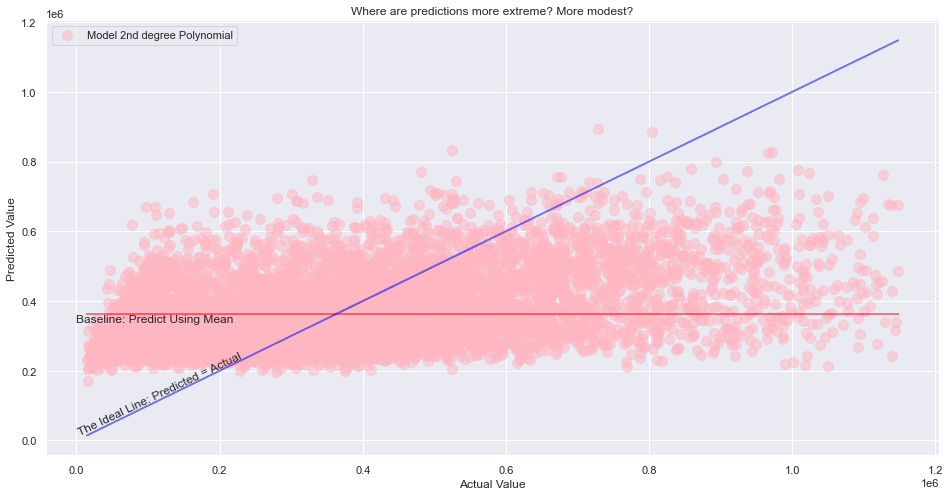

In [51]:
plt.figure(figsize=(16,8))
plt.plot(y_val.value, y_val.pred_mean, alpha=.5, color="red", label='_nolegend_')
plt.annotate("Baseline: Predict Using Mean", (0, 340000))
plt.plot(y_val.value, y_val.value, alpha=.5, color="blue", label='_nolegend_')
plt.annotate("The Ideal Line: Predicted = Actual", (.5, 15000), rotation=25.5)

plt.scatter(y_val.value, y_val.pred_lm2, 
            alpha=.5, color="lightpink", s=100, label="Model 2nd degree Polynomial")
plt.legend()
plt.xlabel("Actual Value")
plt.ylabel("Predicted Value")
plt.title("Where are predictions more extreme? More modest?")

plt.show()

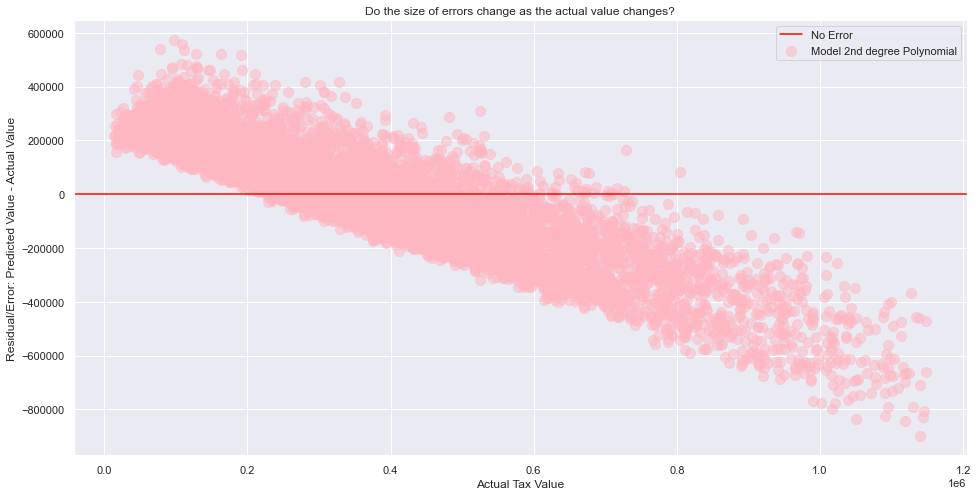

In [54]:
plt.figure(figsize=(16,8))
plt.axhline(label="No Error", color='red')
plt.scatter(y_val.value, y_val.pred_lm2 - y_val.value, 
            alpha=.5, color="lightpink", s=100, label="Model 2nd degree Polynomial")
plt.legend()
plt.xlabel("Actual Tax Value")
plt.ylabel("Residual/Error: Predicted Value - Actual Value")
plt.title("Do the size of errors change as the actual value changes?")

plt.show()

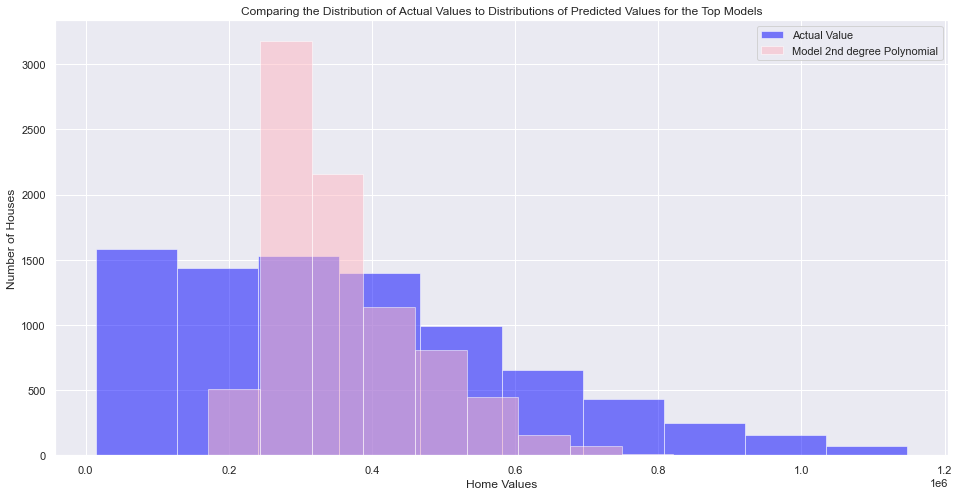

In [53]:
# plot to visualize actual vs predicted. 
plt.figure(figsize=(16,8))
plt.hist(y_val.value, color='blue', alpha=.5, label="Actual Value")
plt.hist(y_val.pred_lm2, color='lightpink', alpha=.5, label="Model 2nd degree Polynomial")
plt.xlabel("Home Values")
plt.ylabel("Number of Houses")
plt.title("Comparing the Distribution of Actual Values to Distributions of Predicted Values for the Top Models")
plt.legend()
plt.show()

## Ok now use all the data

In [16]:
train_scaled.head()

,baths,beds,area,lot_size,value,year_built,zipcode,lat,long,garage,...,location,los_angeles,orange,ventura,decade,yard_size,living_space,half_bath,census_tract,census_block
51225,0.166667,0.375,0.133283,0.212501,65598.0,0.492063,0.001692,0.487981,0.679078,0.2,...,Los Angeles,1,0,0,1940,0.259470,0.072332,0.0,0.005163,3.780049e-06
3669,0.500000,0.625,0.521750,0.497493,135604.0,0.626984,0.001278,0.679726,0.476064,0.2,...,Los Angeles,1,0,0,1960,0.472726,0.400165,0.0,0.000074,7.766403e-01
40091,0.500000,0.625,0.455235,0.287951,704000.0,0.650794,0.001218,0.738436,0.453173,0.2,...,Los Angeles,1,0,0,1960,0.281708,0.327833,0.0,0.011084,2.285212e-07
25937,0.333333,0.500,0.314112,0.262061,333484.0,0.746032,0.001380,0.781666,0.528681,0.2,...,Los Angeles,1,0,0,1980,0.278864,0.221672,0.0,0.010956,1.237227e-04
52229,0.833333,0.625,0.813606,0.208802,1495000.0,0.904762,0.001169,0.564892,0.405138,0.2,...,Los Angeles,1,0,0,2000,0.149662,0.695545,0.0,0.009458,1.890369e-02


In [22]:
X_train, y_train = train_scaled.drop(columns=['location', 'decade', 'value', 'yard_size','half_bath', 'garage', 'living_space']), train.value
X_val, y_val = val_scaled.drop(columns=['location', 'decade', 'value','yard_size','half_bath', 'garage', 'living_space']), val.value
X_test, y_test = test_scaled.drop(columns=['location', 'decade', 'value','yard_size','half_bath', 'garage', 'living_space']), test.value

In [23]:
y_train = pd.DataFrame(y_train)
y_val = pd.DataFrame(y_val)
y_test = pd.DataFrame(y_test)

In [28]:
pf = PolynomialFeatures(degree=3)
X_train_d2 = pf.fit_transform(X_train)
X_val_d2 = pf.transform(X_val)
X_test_d2 = pf.transform(X_test)

lm2 = LinearRegression()
lm2.fit(X_train_d2, y_train.value)

y_train['pred_lm2'] = lm2.predict(X_train_d2)
rmse_train = mean_squared_error(y_train.value, y_train.pred_lm2, squared=False)
y_val['pred_lm2'] = lm2.predict(X_val_d2)
rmse_val = mean_squared_error(y_val.value, y_val.pred_lm2, squared=False)


d = {
    'model': 'd3',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_lm2)}
d

{'model': 'd3', 'rmse_val': 270095.4470254719, 'r2_val': 0.39120678976828005}

In [25]:
pred_mean = y_train.value.mean()
y_train['pred_mean'] = pred_mean
y_val['pred_mean'] = pred_mean

pred_median = y_train.value.median()
y_train['pred_median'] = pred_median
y_val['pred_median'] = pred_median

rmse_train = mean_squared_error(y_train.value, y_train.pred_mean, squared=False)
rmse_val = mean_squared_error(y_val.value, y_val.pred_mean, squared=False)

print("RMSE using Mean\nTrain/In-Sample: ", round(rmse_train, 2), 
      "\nValidate/Out-of-Sample: ", round(rmse_val, 2))
print()

rmse_train = mean_squared_error(y_train.value, y_train.pred_median, squared=False)
rmse_val = mean_squared_error(y_val.value, y_val.pred_median, squared=False)

print("RMSE using Median\nTrain/In-Sample: ", round(rmse_train, 2), 
      "\nValidate/Out-of-Sample: ", round(rmse_val, 2))

RMSE using Mean
Train/In-Sample:  343279.57 
Validate/Out-of-Sample:  346314.24

RMSE using Median
Train/In-Sample:  348553.79 
Validate/Out-of-Sample:  349787.82


In [26]:
metrics = pd.DataFrame(data=[{
    'model': 'baseline_mean',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_mean)}])
metrics

,model,rmse_val,r2_val
0,baseline_mean,349787.816831,-2.220446e-16


In [27]:
# OLS Model
lm = LinearRegression()
lm.fit(X_train, y_train.value)
y_train['pred_lm'] = lm.predict(X_train)
rmse_train = mean_squared_error(y_train.value, y_train.pred_lm, squared=False)
y_val['pred_lm'] = lm.predict(X_val)
rmse_val = mean_squared_error(y_val.value, y_val.pred_lm, squared=False)

metrics = metrics.append({
    'model': 'OLS',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_lm)}, ignore_index=True)

# LassoLars Model
lars = LassoLars(alpha=1)
lars.fit(X_train, y_train.value)
y_train['pred_lars'] = lars.predict(X_train)
rmse_train = mean_squared_error(y_train.value, y_train.pred_lars, squared=False)
y_val['pred_lars'] = lars.predict(X_val)
rmse_val = mean_squared_error(y_val.value, y_val.pred_lars, squared=False)

metrics = metrics.append({
    'model': 'LarsLasso, alpha 1',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_lars)}, ignore_index=True)

# Tweedie Models
glm = TweedieRegressor(power=1, alpha=0)
glm.fit(X_train, y_train.value)
y_train['pred_glm'] = glm.predict(X_train)
rmse_train = mean_squared_error(y_train.value, y_train.pred_glm, squared=False)
y_val['pred_glm'] = glm.predict(X_val)
rmse_val = mean_squared_error(y_val.value, y_val.pred_glm, squared=False)

metrics = metrics.append({
    'model': 'poisson',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_glm)}, ignore_index=True)

glm = TweedieRegressor(power=2, alpha=0)
glm.fit(X_train, y_train.value)
y_train['pred_glm'] = glm.predict(X_train)
rmse_train = mean_squared_error(y_train.value, y_train.pred_glm, squared=False)
y_val['pred_glm'] = glm.predict(X_val)
rmse_val = mean_squared_error(y_val.value, y_val.pred_glm, squared=False)

metrics = metrics.append({
    'model': 'gamma',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_glm)}, ignore_index=True)

glm = TweedieRegressor(power=3, alpha=0)
glm.fit(X_train, y_train.value)
y_train['pred_glm'] = glm.predict(X_train)
rmse_train = mean_squared_error(y_train.value, y_train.pred_glm, squared=False)
y_val['pred_glm'] = glm.predict(X_val)
rmse_val = mean_squared_error(y_val.value, y_val.pred_glm, squared=False)

metrics = metrics.append({
    'model': 'inverse gaussian',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_glm)}, ignore_index=True)


# Polynomial Models
pf = PolynomialFeatures(degree=2)
X_train_d2 = pf.fit_transform(X_train)
X_val_d2 = pf.transform(X_val)
X_test_d2 = pf.transform(X_test)

lm2 = LinearRegression()
lm2.fit(X_train_d2, y_train.value)

y_train['pred_lm2'] = lm2.predict(X_train_d2)
rmse_train = mean_squared_error(y_train.value, y_train.pred_lm2, squared=False)
y_val['pred_lm2'] = lm2.predict(X_val_d2)
rmse_val = mean_squared_error(y_val.value, y_val.pred_lm2, squared=False)

metrics = metrics.append({
    'model': 'd2',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_lm2)}, ignore_index=True)

pf = PolynomialFeatures(degree=3)
X_train_d2 = pf.fit_transform(X_train)
X_val_d2 = pf.transform(X_val)
X_test_d2 = pf.transform(X_test)

lm2 = LinearRegression()
lm2.fit(X_train_d2, y_train.value)

y_train['pred_lm2'] = lm2.predict(X_train_d2)
rmse_train = mean_squared_error(y_train.value, y_train.pred_lm2, squared=False)
y_val['pred_lm2'] = lm2.predict(X_val_d2)
rmse_val = mean_squared_error(y_val.value, y_val.pred_lm2, squared=False)

metrics = metrics.append({
    'model': 'd3',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_lm2)}, ignore_index=True)

pf = PolynomialFeatures(degree=4)
X_train_d2 = pf.fit_transform(X_train)
X_val_d2 = pf.transform(X_val)
X_test_d2 = pf.transform(X_test)

lm2 = LinearRegression()
lm2.fit(X_train_d2, y_train.value)

y_train['pred_lm2'] = lm2.predict(X_train_d2)
rmse_train = mean_squared_error(y_train.value, y_train.pred_lm2, squared=False)
y_val['pred_lm2'] = lm2.predict(X_val_d2)
rmse_val = mean_squared_error(y_val.value, y_val.pred_lm2, squared=False)

metrics = metrics.append({
    'model': 'd4',
    'rmse_val': rmse_val,
    'r2_val': explained_variance_score(y_val.value, y_val.pred_lm2)}, ignore_index=True)

metrics

/var/folders/tg/htdzmdmj40vgs24scqz284xm0000gn/T/ipykernel_56656/3157293954.py:9: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append({
/opt/homebrew/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_base.py:133: FutureWarning: The default of 'normalize' will be set to False in version 1.2 and deprecated in version 1.4.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), LassoLars())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * np.sqrt(n_samples). 
  warnings.warn(
/var/folders

,model,rmse_val,r2_val
0,baseline_mean,349787.816831,-2.220446e-16
1,OLS,289476.587972,3.017942e-01
2,"LarsLasso, alpha 1",289596.409476,3.013463e-01
3,poisson,291720.812764,2.909476e-01
4,gamma,295574.243394,2.727617e-01
5,inverse gaussian,346314.240524,-2.220446e-16
6,d2,274281.338620,3.729481e-01
7,d3,270095.447025,3.912068e-01
8,d4,653002.084561,-2.556425e+00


In [104]:
# d3 wins, not much better

In [105]:
pf = PolynomialFeatures(degree=3)
X_train_d2 = pf.fit_transform(X_train)
X_val_d2 = pf.transform(X_val)
X_test_d2 = pf.transform(X_test)

lm2 = LinearRegression()
lm2.fit(X_train_d2, y_train.value)

y_train['pred_lm2'] = lm2.predict(X_train_d2)
rmse_train = mean_squared_error(y_train.value, y_train.pred_lm2, squared=False)
y_val['pred_lm2'] = lm2.predict(X_val_d2)
rmse_val = mean_squared_error(y_val.value, y_val.pred_lm2, squared=False)
y_test['pred_lm2'] = lm2.predict(X_test_d2)
rmse_test = mean_squared_error(y_test.value, y_test.pred_lm2, squared=False)

print("RMSE for D3\nTraining/In-Sample: ", rmse_train, 
      "\nValidation/Out-of-Sample: ", rmse_val,
      "\nTest/Out-of-Sample: ", rmse_test)

RMSE for D3
Training/In-Sample:  192096.96193243435 
Validation/Out-of-Sample:  192127.23085755957 
Test/Out-of-Sample:  198538.09329761416


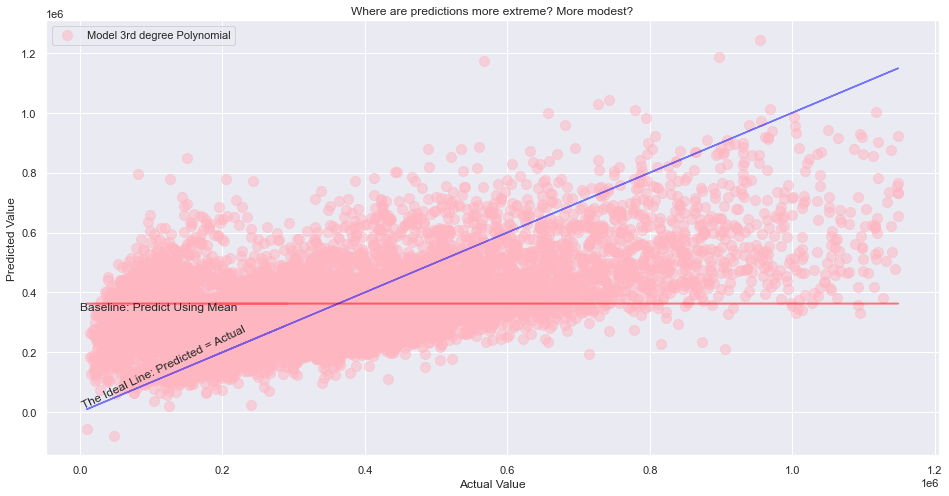

In [106]:
plt.figure(figsize=(16,8))
plt.plot(y_val.value, y_val.pred_mean, alpha=.5, color="red", label='_nolegend_')
plt.annotate("Baseline: Predict Using Mean", (0, 340000))
plt.plot(y_val.value, y_val.value, alpha=.5, color="blue", label='_nolegend_')
plt.annotate("The Ideal Line: Predicted = Actual", (.5, 15000), rotation=25.5)

plt.scatter(y_val.value, y_val.pred_lm2, 
            alpha=.5, color="lightpink", s=100, label="Model 3rd degree Polynomial")
plt.legend()
plt.xlabel("Actual Value")
plt.ylabel("Predicted Value")
plt.title("Where are predictions more extreme? More modest?")

plt.show()

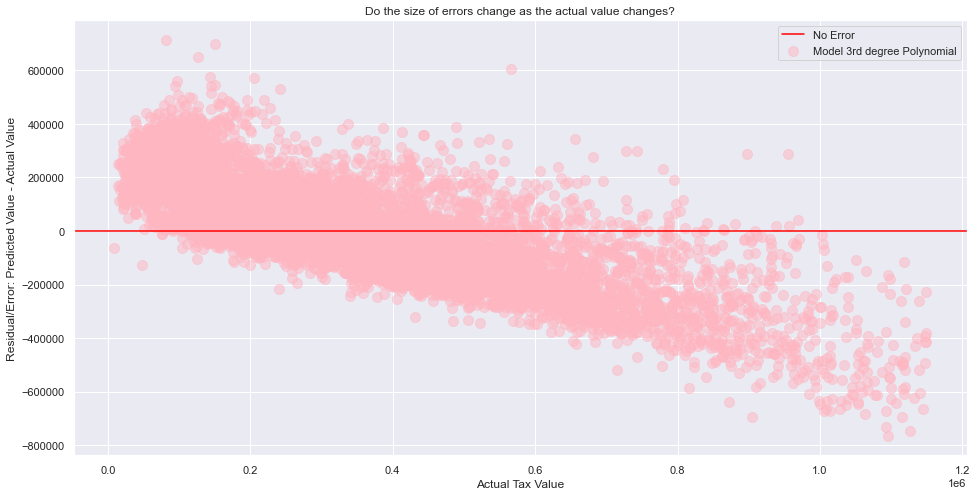

In [107]:
plt.figure(figsize=(16,8))
plt.axhline(label="No Error", color='red')
plt.scatter(y_val.value, y_val.pred_lm2 - y_val.value, 
            alpha=.5, color="lightpink", s=100, label="Model 3rd degree Polynomial")
plt.legend()
plt.xlabel("Actual Tax Value")
plt.ylabel("Residual/Error: Predicted Value - Actual Value")
plt.title("Do the size of errors change as the actual value changes?")

plt.show()

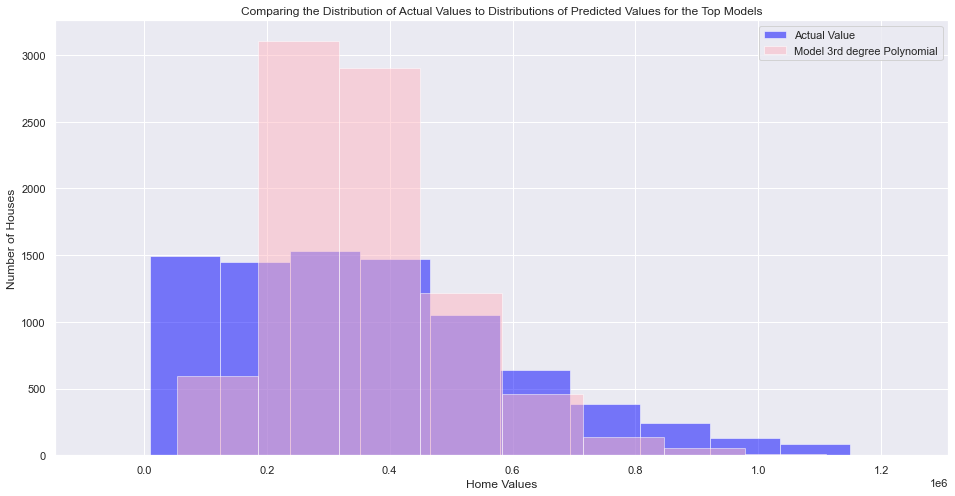

In [108]:
# plot to visualize actual vs predicted. 
plt.figure(figsize=(16,8))
plt.hist(y_val.value, color='blue', alpha=.5, label="Actual Value")
plt.hist(y_val.pred_lm2, color='lightpink', alpha=.5, label="Model 3rd degree Polynomial")
plt.xlabel("Home Values")
plt.ylabel("Number of Houses")
plt.title("Comparing the Distribution of Actual Values to Distributions of Predicted Values for the Top Models")
plt.legend()
plt.show()

In [91]:
explore.select_kbest(X_train, y_train.value, 5)

['baths', 'area', 'year_built', 'lat', 'los_angeles']


In [92]:
explore.select_rfe(X_train, y_train.value, 5)

['area', 'los_angeles', 'orange', 'ventura', 'census_tract']


In [93]:
explore.select_sfs(X_train, y_train.value, 5)

['baths', 'beds', 'area', 'lat', 'long']
